In [1]:
%%capture
# !pip uninstall torch torchvision torchaudio -y
!pip install torchaudio librosa boto3 --no-cache-dir

In [2]:
%%capture
!conda install -c roebel pysndfile --y 
!pip install pysndfile

In [3]:
import torch
import torch.nn as nn
import torch.nn.functional as F
import torch.optim as optim
import torchaudio
import sys
import os

import matplotlib.pyplot as plt
import IPython.display as ipd

from tqdm import tqdm
import torchaudio.transforms as T

In [4]:
print(torchaudio.__version__)
print(torch.__version__)

0.8.1
1.8.1+cu102


In [ ]:
# !pip install kaggle

In [ ]:
# mv /root/kaggle.json /root/.kaggle

In [ ]:
# !chmod 600 /root/.kaggle/kaggle.json

In [ ]:
# !kaggle competitions list

In [ ]:
# !kaggle competitions download -c birdclef-2021

In [ ]:
# !mkdir /root/data/
# !mv /root/birdclef-2021.zip /root/data/
# !unzip /root/data/birdclef-2021.zip

In [ ]:
# !mkdir /root/data/
# !mv /root/birdclef-2021.zip /root/data/
# !unzip /root/data/birdclef-2021.zip

In [5]:
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
print(device)

cuda


In [6]:
# !pip install librosa
# !pip install pysndfile
# !pip install torchaudio librosa boto3 --no-cache-dir

In [7]:
import io
import os
import math
import tarfile
import multiprocessing

import scipy
import librosa
import boto3
from botocore import UNSIGNED
from botocore.config import Config
import requests
import matplotlib
import matplotlib.pyplot as plt
from IPython.display import Audio, display

[width, height] = matplotlib.rcParams['figure.figsize']
if width < 10:
  matplotlib.rcParams['figure.figsize'] = [width * 2.5, height]

def get_noise_sample(*, resample=None):
  return _get_sample(SAMPLE_NOISE_PATH, resample=resample)

def print_metadata(metadata, src=None):
  if src:
    print("-" * 10)
    print("Source:", src)
    print("-" * 10)
  print(" - sample_rate:", metadata.sample_rate)
  print(" - num_channels:", metadata.num_channels)
  print(" - num_frames:", metadata.num_frames)
  print(" - bits_per_sample:", metadata.bits_per_sample)
  print(" - encoding:", metadata.encoding)
  print()

def print_stats(waveform, sample_rate=None, src=None):
  if src:
    print("-" * 10)
    print("Source:", src)
    print("-" * 10)
  if sample_rate:
    print("Sample Rate:", sample_rate)
  print("Shape:", tuple(waveform.shape))
  print("Dtype:", waveform.dtype)
  print(f" - Max:     {waveform.max().item():6.3f}")
  print(f" - Min:     {waveform.min().item():6.3f}")
  print(f" - Mean:    {waveform.mean().item():6.3f}")
  print(f" - Std Dev: {waveform.std().item():6.3f}")
  print()
  print(waveform)
  print()

def plot_waveform(waveform, sample_rate, title="Waveform", xlim=None, ylim=None):
  waveform = waveform.numpy()

  num_channels, num_frames = waveform.shape
  time_axis = torch.arange(0, num_frames) / sample_rate

  figure, axes = plt.subplots(num_channels, 1)
  if num_channels == 1:
    axes = [axes]
  for c in range(num_channels):
    axes[c].plot(time_axis, waveform[c], linewidth=1)
    axes[c].grid(True)
    if num_channels > 1:
      axes[c].set_ylabel(f'Channel {c+1}')
    if xlim:
      axes[c].set_xlim(xlim)
    if ylim:
      axes[c].set_ylim(ylim)
  figure.suptitle(title)
  plt.show(block=False)

def plot_specgram(waveform, sample_rate, title="Spectrogram", xlim=None):
  waveform = waveform.numpy()

  num_channels, num_frames = waveform.shape
  time_axis = torch.arange(0, num_frames) / sample_rate

  figure, axes = plt.subplots(num_channels, 1)
  if num_channels == 1:
    axes = [axes]
  for c in range(num_channels):
    axes[c].specgram(waveform[c], Fs=sample_rate)
    if num_channels > 1:
      axes[c].set_ylabel(f'Channel {c+1}')
    if xlim:
      axes[c].set_xlim(xlim)
  figure.suptitle(title)
  plt.show(block=False)

def play_audio(waveform, sample_rate):
  waveform = waveform.numpy()

  num_channels, num_frames = waveform.shape
  if num_channels == 1:
    display(Audio(waveform[0], rate=sample_rate))
  elif num_channels == 2:
    display(Audio((waveform[0], waveform[1]), rate=sample_rate))
  else:
    raise ValueError("Waveform with more than 2 channels are not supported.")

def inspect_file(path):
  print("-" * 10)
  print("Source:", path)
  print("-" * 10)
  print(f" - File size: {os.path.getsize(path)} bytes")
  print_metadata(torchaudio.info(path))

def plot_spectrogram(spec, title=None, ylabel='freq_bin', aspect='auto', xmax=None):
  fig, axs = plt.subplots(1, 1)
  axs.set_title(title or 'Spectrogram (db)')
  axs.set_ylabel(ylabel)
  axs.set_xlabel('frame')
  im = axs.imshow(librosa.power_to_db(spec), origin='lower', aspect=aspect)
  if xmax:
    axs.set_xlim((0, xmax))
  fig.colorbar(im, ax=axs)
  plt.show(block=False)

def plot_mel_fbank(fbank, title=None):
  fig, axs = plt.subplots(1, 1)
  axs.set_title(title or 'Filter bank')
  axs.imshow(fbank, aspect='auto')
  axs.set_ylabel('frequency bin')
  axs.set_xlabel('mel bin')
  plt.show(block=False)

def get_spectrogram(
    n_fft = 400,
    win_len = None,
    hop_len = None,
    power = 2.0,
    waveform = None
    
):
#   waveform, _ = get_speech_sample()
  spectrogram = T.Spectrogram(
      n_fft=n_fft,
      win_length=win_len,
      hop_length=hop_len,
      center=True,
      pad_mode="reflect",
      power=power,
  )
  return spectrogram(waveform)

def plot_pitch(waveform, sample_rate, pitch):
  figure, axis = plt.subplots(1, 1)
  axis.set_title("Pitch Feature")
  axis.grid(True)

  end_time = waveform.shape[1] / sample_rate
  time_axis = torch.linspace(0, end_time,  waveform.shape[1])
  axis.plot(time_axis, waveform[0], linewidth=1, color='gray', alpha=0.3)

  axis2 = axis.twinx()
  time_axis = torch.linspace(0, end_time, pitch.shape[1])
  ln2 = axis2.plot(
      time_axis, pitch[0], linewidth=2, label='Pitch', color='green')

  axis2.legend(loc=0)
  plt.show(block=False)

def plot_kaldi_pitch(waveform, sample_rate, pitch, nfcc):
  figure, axis = plt.subplots(1, 1)
  axis.set_title("Kaldi Pitch Feature")
  axis.grid(True)

  end_time = waveform.shape[1] / sample_rate
  time_axis = torch.linspace(0, end_time,  waveform.shape[1])
  axis.plot(time_axis, waveform[0], linewidth=1, color='gray', alpha=0.3)

  time_axis = torch.linspace(0, end_time, pitch.shape[1])
  ln1 = axis.plot(time_axis, pitch[0], linewidth=2, label='Pitch', color='green')
  axis.set_ylim((-1.3, 1.3))

  axis2 = axis.twinx()
  time_axis = torch.linspace(0, end_time, nfcc.shape[1])
  ln2 = axis2.plot(
      time_axis, nfcc[0], linewidth=2, label='NFCC', color='blue', linestyle='--')

  lns = ln1 + ln2
  labels = [l.get_label() for l in lns]
  axis.legend(lns, labels, loc=0)
  plt.show(block=False)

In [8]:
SAMPLE_WAV_PATH = 'data/train_short_audio/casfin/XC52365.ogg'
metadata = torchaudio.info(SAMPLE_WAV_PATH)
print_metadata(metadata, src=SAMPLE_WAV_PATH)

----------
Source: data/train_short_audio/casfin/XC52365.ogg
----------
 - sample_rate: 32000
 - num_channels: 1
 - num_frames: 810458
 - bits_per_sample: 0
 - encoding: VORBIS



Sample Rate: 32000
Shape: (1, 810458)
Dtype: torch.float32
 - Max:      0.943
 - Min:     -0.958
 - Mean:    -0.000
 - Std Dev:  0.092

tensor([[ 3.0518e-05, -2.7466e-04, -4.5776e-04,  ...,  1.8951e-02,
         -1.2360e-02, -4.2023e-02]])



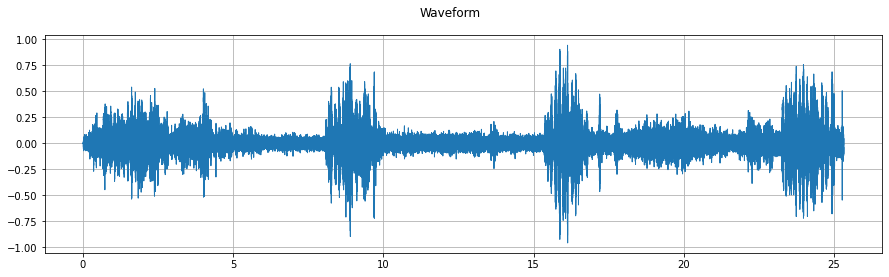

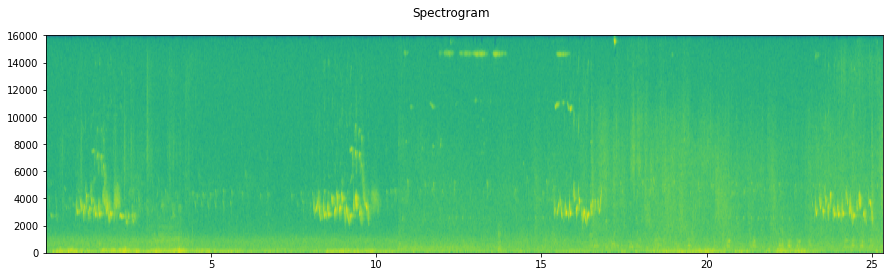

In [9]:
waveform, sample_rate = torchaudio.load(SAMPLE_WAV_PATH)

print_stats(waveform, sample_rate=sample_rate)
plot_waveform(waveform, sample_rate)
plot_specgram(waveform, sample_rate)
play_audio(waveform, sample_rate)

Shape: (1, 513, 1583)
Dtype: torch.float32
 - Max:     21762.521
 - Min:      0.000
 - Mean:     3.292
 - Std Dev: 78.491

tensor([[[2.1114e-03, 8.8339e+00, 2.0251e+00,  ..., 2.5935e+00,
          1.5511e+00, 9.1048e+00],
         [1.7868e-04, 4.4541e+00, 3.0272e+01,  ..., 5.8980e+00,
          3.0423e+01, 2.3088e+01],
         [3.5620e-04, 4.0535e-01, 1.4764e+01,  ..., 8.7700e-01,
          6.1631e+01, 2.0022e+01],
         ...,
         [5.7692e-07, 4.4663e-07, 4.2181e-07,  ..., 1.2770e-06,
          1.7219e-07, 2.5887e-05],
         [9.5893e-07, 6.8944e-07, 1.4088e-07,  ..., 9.2237e-06,
          3.9402e-09, 1.6957e-05],
         [8.4479e-07, 9.3445e-07, 1.6235e-09,  ..., 2.3243e-06,
          1.1972e-07, 2.6855e-05]]])



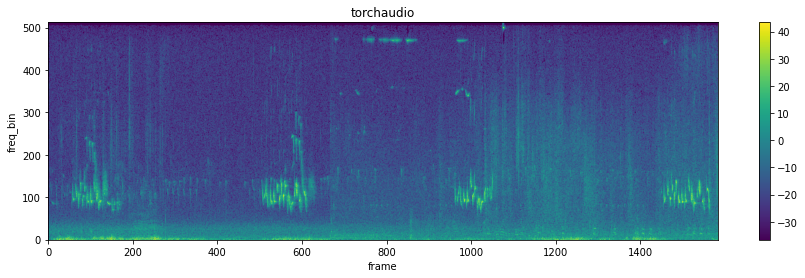

In [10]:
n_fft = 1024
win_length = None
hop_length = 512

# define transformation
spectrogram = T.Spectrogram(
    n_fft=n_fft,
    win_length=win_length,
    hop_length=hop_length,
    center=True,
    pad_mode="reflect",
    power=2.0,
)
# Perform transformation
spec = spectrogram(waveform)

print_stats(spec)
plot_spectrogram(spec[0], title='torchaudio')

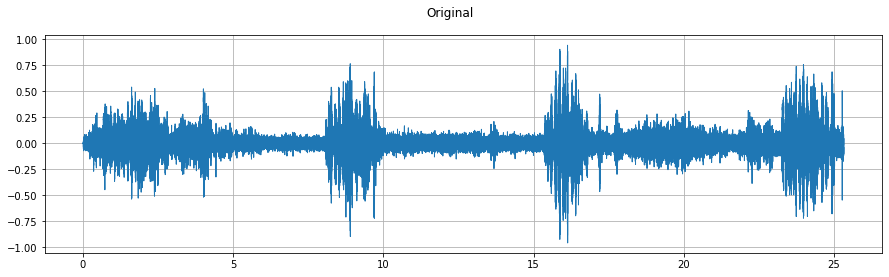

/opt/conda/lib/python3.6/site-packages/torch/functional.py:655: UserWarning: istft will require a complex-valued input tensor in a future PyTorch release. Matching the output from stft with return_complex=True.  (Triggered internally at  /pytorch/aten/src/ATen/native/SpectralOps.cpp:787.)
  normalized, onesided, length, return_complex)


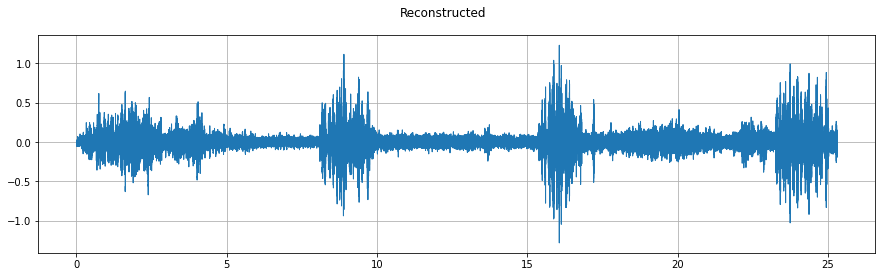

In [11]:
plot_waveform(waveform, sample_rate, title="Original")
play_audio(waveform, sample_rate)

n_fft = 1024
win_length = None
hop_length = 512

spec = T.Spectrogram(
    n_fft=n_fft,
    win_length=win_length,
    hop_length=hop_length,
)(waveform)

griffin_lim = T.GriffinLim(
    n_fft=n_fft,
    win_length=win_length,
    hop_length=hop_length,
)
waveform = griffin_lim(spec)

plot_waveform(waveform, sample_rate, title="Reconstructed")
play_audio(waveform, sample_rate)

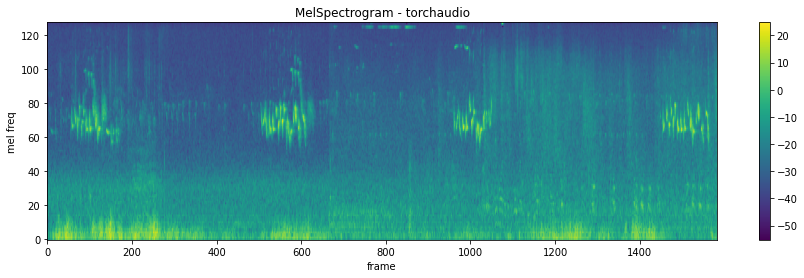

In [12]:
n_fft = 1024
win_length = None
hop_length = 512
n_mels = 128

mel_spectrogram = T.MelSpectrogram(
    sample_rate=sample_rate,
    n_fft=n_fft,
    win_length=win_length,
    hop_length=hop_length,
    center=True,
    pad_mode="reflect",
    power=2.0,
    norm='slaney',
    onesided=True,
    n_mels=n_mels,
)

melspec = mel_spectrogram(waveform)
plot_spectrogram(
    melspec[0], title="MelSpectrogram - torchaudio", ylabel='mel freq')

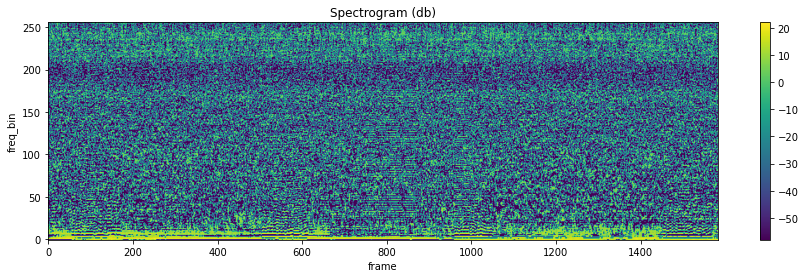

In [13]:
n_fft = 2048
win_length = None
hop_length = 512
n_mels = 256
n_mfcc = 256

mfcc_transform = T.MFCC(
    sample_rate=sample_rate,
    n_mfcc=n_mfcc, melkwargs={'n_fft': n_fft, 'n_mels': n_mels, 'hop_length': hop_length})

mfcc = mfcc_transform(waveform)

plot_spectrogram(mfcc[0])

In [14]:
print("Shape of waveform: {}".format(waveform.size()))
print("Sample rate of waveform: {}".format(sample_rate))

Shape of waveform: torch.Size([1, 809984])
Sample rate of waveform: 32000


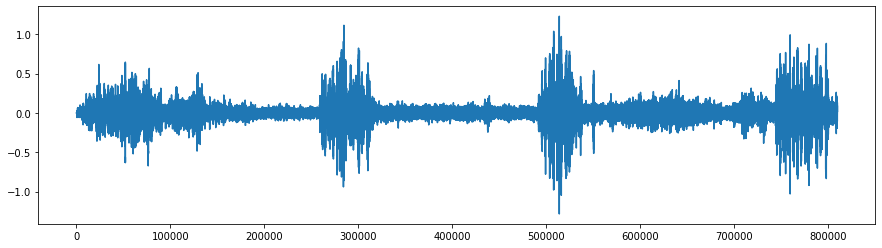

In [15]:
plt.plot(waveform.t().numpy());

In [16]:
ipd.Audio(waveform.numpy(), rate=sample_rate)

In [17]:
new_sample_rate = 8000
transform = torchaudio.transforms.Resample(orig_freq=sample_rate, new_freq=new_sample_rate)
transformed = transform(waveform)

ipd.Audio(transformed.numpy(), rate=new_sample_rate)

In [18]:
print("Shape of waveform: {}".format(transformed.size()))
print("Sample rate of waveform: {}".format(sample_rate))

Shape of waveform: torch.Size([1, 202496])
Sample rate of waveform: 32000


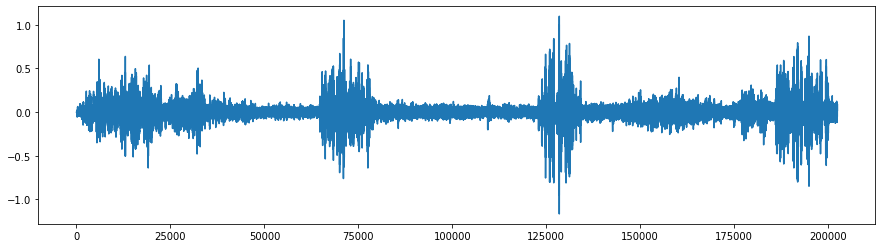

In [19]:
plt.plot(transformed.t().numpy());

In [20]:
def pad_sequence(batch):
    # Make all tensor in a batch the same length by padding with zeros
    batch = [item.t() for item in batch]
    batch = torch.nn.utils.rnn.pad_sequence(batch, batch_first=True, padding_value=0.)
    return batch.permute(0, 2, 1)

In [21]:
def collate_fn(batch):

    # A data tuple has the form:
    # waveform, sample_rate, label, speaker_id, utterance_number

    tensors, targets = [], []

    # Gather in lists, and encode labels as indices
    for waveform, label, in batch:
        tensors += [waveform]
        targets += [label]

    # Group the list of tensors into a batched tensor
    tensors = pad_sequence(tensors)
    targets = torch.stack(targets)

    return tensors, targets

In [22]:
import glob
import os
# direct =[]
direct = glob.glob('training/*/*')

In [23]:
training_dir = 'training'

In [24]:
training_directory = os.path.join(training_dir,"*/*")
training_directory

'training/*/*'

In [25]:
directory = glob.glob(os.path.join(training_dir,'*/*'))

In [26]:
waveform = [torchaudio.load(each)[0] for each in direct]

In [27]:
len(waveform)

322

In [28]:
labels = [label.split('/')[1] for label in direct]

In [29]:
# feel free to use this import 
from collections import Counter

## Build a dictionary that maps words to integers
counts = Counter(labels)
count = sorted(counts, key=counts.get, reverse=True)
int_labels = {word: ii for ii, word in enumerate(count, 1)}

## use the dict to tokenize each review in reviews_split
## store the tokenized reviews in reviews_ints
number_labels = []
for num in labels:
    number_labels.append(torch.tensor(int_labels[num]))

In [30]:
training_set = []
for i in range(len(number_labels)):
    training_set.append((waveform[i], number_labels[i])) 

In [31]:
batch_size = 10

if device == "cuda":
    num_workers = 1
    pin_memory = True
else:
    num_workers = 0
    pin_memory = False

train_loader = torch.utils.data.DataLoader(
    training_set,
    batch_size=batch_size,
    shuffle=True,
    collate_fn=collate_fn,
    num_workers=num_workers,
    pin_memory=pin_memory,
)
# test_loader = torch.utils.data.DataLoader(
#     test_set,
#     batch_size=batch_size,
#     shuffle=False,
#     drop_last=False,
#     collate_fn=collate_fn,
#     num_workers=num_workers,
#     pin_memory=pin_memory,
# )


In [32]:
train_loader

In [33]:
dataiter = iter(train_loader)
sample_x, sample_y = dataiter.next()

print('Sample input size: ', sample_x.size()) # batch_size, seq_length
print('Sample input: \n', sample_x)
print()
print('Sample label size: ', sample_y.size()) # batch_size
print('Sample label: \n', sample_y)

Sample input size:  torch.Size([10, 1, 4087258])
Sample input: 
 tensor([[[ 2.4414e-04,  2.7466e-04,  2.1362e-04,  ...,  0.0000e+00,
           0.0000e+00,  0.0000e+00]],

        [[ 0.0000e+00,  0.0000e+00,  0.0000e+00,  ...,  0.0000e+00,
           0.0000e+00,  0.0000e+00]],

        [[ 0.0000e+00,  0.0000e+00,  0.0000e+00,  ...,  2.3804e-03,
           1.5869e-03,  3.6621e-04]],

        ...,

        [[ 0.0000e+00, -3.0518e-05, -3.0518e-05,  ...,  0.0000e+00,
           0.0000e+00,  0.0000e+00]],

        [[ 2.8381e-03,  3.5706e-03,  3.3264e-03,  ...,  0.0000e+00,
           0.0000e+00,  0.0000e+00]],

        [[ 0.0000e+00,  0.0000e+00,  0.0000e+00,  ...,  0.0000e+00,
           0.0000e+00,  0.0000e+00]]])

Sample label size:  torch.Size([10])
Sample label: 
 tensor([1, 2, 1, 1, 2, 2, 1, 1, 2, 1])


In [34]:
import pandas as pd
import boto3
import sagemaker
import logging
from botocore.exceptions import ClientError

In [35]:
s3 = boto3.resource('s3')

# session and role
sagemaker_session = sagemaker.Session()
role = sagemaker.get_execution_role()

# create an S3 bucket
bucket = sagemaker_session.default_bucket()

Couldn't call 'get_role' to get Role ARN from role name sagemaker-studio-429892070365-exdyfrjo5j to get Role path.


In [36]:
# import a PyTorch wrapper
from sagemaker.pytorch import PyTorch

# specify an output path
# prefix is specified above
prefix  = 'modelo'
output_path = 's3://{}/{}'.format(bucket, prefix)

# instantiate a pytorch estimator
estimator = PyTorch(entry_point='train.py',
                    source_dir='src', # this should be just "source" for your code
                    role=role,
                    framework_version='1.8.0',
                    py_version='py3',
                    instance_count=1,
                    instance_type='ml.p3.2xlarge',
                    use_spot_instances = True,
                    max_run = 3600,
                    max_wait = 3600,
                    output_path=output_path,
                    sagemaker_session=sagemaker_session,
                    hyperparameters={                
                        'epochs': 20, # could change to higher
                        'batch-size': 10
                    })

In [37]:
train_data_path = "s3://" + bucket + "/pipeline/data/"
train_data_path

's3://sagemaker-us-east-1-429892070365/pipeline/data/'

In [ ]:
%%time

# Train your estimator on S3 training data
estimator.fit({'train': train_data_path})

2021-05-17 01:41:52 Starting - Starting the training job...
2021-05-17 01:42:15 Starting - Launching requested ML instancesProfilerReport-1621215712: InProgress
......
2021-05-17 01:43:15 Starting - Preparing the instances for training.........
2021-05-17 01:44:50 Downloading - Downloading input data
2021-05-17 01:44:50 Training - Downloading the training image......

In [38]:
class M5(nn.Module):
    def __init__(self, n_input=1, n_output=35, stride=16, n_channel=32):
        super().__init__()
        self.conv1 = nn.Conv1d(n_input, n_channel, kernel_size=80, stride=stride)
        self.bn1 = nn.BatchNorm1d(n_channel)
        self.pool1 = nn.MaxPool1d(4)
        self.conv2 = nn.Conv1d(n_channel, n_channel, kernel_size=3)
        self.bn2 = nn.BatchNorm1d(n_channel)
        self.pool2 = nn.MaxPool1d(4)
        self.conv3 = nn.Conv1d(n_channel, 2 * n_channel, kernel_size=3)
        self.bn3 = nn.BatchNorm1d(2 * n_channel)
        self.pool3 = nn.MaxPool1d(4)
        self.conv4 = nn.Conv1d(2 * n_channel, 2 * n_channel, kernel_size=3)
        self.bn4 = nn.BatchNorm1d(2 * n_channel)
        self.pool4 = nn.MaxPool1d(4)
        self.fc1 = nn.Linear(2 * n_channel, n_output)

    def forward(self, x):
        x = self.conv1(x)
        x = F.relu(self.bn1(x))
        x = self.pool1(x)
        x = self.conv2(x)
        x = F.relu(self.bn2(x))
        x = self.pool2(x)
        x = self.conv3(x)
        x = F.relu(self.bn3(x))
        x = self.pool3(x)
        x = self.conv4(x)
        x = F.relu(self.bn4(x))
        x = self.pool4(x)
        x = F.avg_pool1d(x, x.shape[-1])
        x = x.permute(0, 2, 1)
        x = self.fc1(x)
        return F.log_softmax(x, dim=2)


model = M5(n_input=transformed.shape[0], n_output=len(labels))
model.to(device)
print(model)


def count_parameters(model):
    return sum(p.numel() for p in model.parameters() if p.requires_grad)


n = count_parameters(model)
print("Number of parameters: %s" % n)

M5(
  (conv1): Conv1d(1, 32, kernel_size=(80,), stride=(16,))
  (bn1): BatchNorm1d(32, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
  (pool1): MaxPool1d(kernel_size=4, stride=4, padding=0, dilation=1, ceil_mode=False)
  (conv2): Conv1d(32, 32, kernel_size=(3,), stride=(1,))
  (bn2): BatchNorm1d(32, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
  (pool2): MaxPool1d(kernel_size=4, stride=4, padding=0, dilation=1, ceil_mode=False)
  (conv3): Conv1d(32, 64, kernel_size=(3,), stride=(1,))
  (bn3): BatchNorm1d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
  (pool3): MaxPool1d(kernel_size=4, stride=4, padding=0, dilation=1, ceil_mode=False)
  (conv4): Conv1d(64, 64, kernel_size=(3,), stride=(1,))
  (bn4): BatchNorm1d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
  (pool4): MaxPool1d(kernel_size=4, stride=4, padding=0, dilation=1, ceil_mode=False)
  (fc1): Linear(in_features=64, out_features=322, bias=True)
)
Numb

In [39]:
optimizer = optim.Adam(model.parameters(), lr=0.01, weight_decay=0.0001)
scheduler = optim.lr_scheduler.StepLR(optimizer, step_size=20, gamma=0.1)  # reduce the learning after 20 epochs by a factor of 10

In [40]:
def train(model, epoch, log_interval):
    model.train()
    for batch_idx, (data, target) in enumerate(train_loader):

        data = data.to(device)
        target = target.to(device)

        # apply transform and model on whole batch directly on device
        data = transform(data)
        output = model(data)

        # negative log-likelihood for a tensor of size (batch x 1 x n_output)
        loss = F.nll_loss(output.squeeze(), target)

        optimizer.zero_grad()
        loss.backward()
        optimizer.step()

        # print training stats
        if batch_idx % log_interval == 0:
            print(f"Train Epoch: {epoch} [{batch_idx * len(data)}/{len(train_loader.dataset)} ({100. * batch_idx / len(train_loader):.0f}%)]\tLoss: {loss.item():.6f}")

        # update progress bar
        pbar.update(pbar_update)
        # record loss
        losses.append(loss.item())

  3%|▎         | 0.06060606060606061/2 [00:00<00:08,  4.14s/it] 

Train Epoch: 1 [0/322 (0%)]	Loss: 5.827943


  9%|▉         | 0.18181818181818182/2 [00:01<00:18, 10.09s/it]

Train Epoch: 1 [50/322 (15%)]	Loss: 3.663068


 18%|█▊        | 0.36363636363636354/2 [00:03<00:10,  6.65s/it]

Train Epoch: 1 [100/322 (30%)]	Loss: 1.493785


 26%|██▌       | 0.5151515151515149/2 [00:03<00:06,  4.67s/it] 

Train Epoch: 1 [150/322 (45%)]	Loss: 0.672601


 32%|███▏      | 0.636363636363636/2 [00:04<00:07,  5.50s/it] 

Train Epoch: 1 [200/322 (61%)]	Loss: 0.714879


 41%|████      | 0.8181818181818177/2 [00:06<00:10,  9.13s/it]

Train Epoch: 1 [250/322 (76%)]	Loss: 0.651995


 50%|████▉     | 0.9999999999999993/2 [00:07<00:04,  4.99s/it]

Train Epoch: 1 [300/322 (91%)]	Loss: 0.646683


 53%|█████▎    | 1.0606060606060599/2 [00:07<00:05,  5.44s/it]

Train Epoch: 2 [0/322 (0%)]	Loss: 0.569104


 61%|██████    | 1.2121212121212113/2 [00:08<00:04,  5.28s/it]

Train Epoch: 2 [50/322 (15%)]	Loss: 0.561273


 68%|██████▊   | 1.3636363636363626/2 [00:09<00:06, 10.06s/it]

Train Epoch: 2 [100/322 (30%)]	Loss: 0.726275


 74%|███████▍  | 1.4848484848484838/2 [00:10<00:03,  6.49s/it]

Train Epoch: 2 [150/322 (45%)]	Loss: 0.855338


 82%|████████▏ | 1.6363636363636351/2 [00:11<00:03,  9.18s/it]

Train Epoch: 2 [200/322 (61%)]	Loss: 0.478551


 91%|█████████ | 1.8181818181818168/2 [00:12<00:00,  4.68s/it]

Train Epoch: 2 [250/322 (76%)]	Loss: 0.732677


 98%|█████████▊| 1.9696969696969682/2 [00:13<00:00,  7.61s/it]

Train Epoch: 2 [300/322 (91%)]	Loss: 0.711477


100%|█████████▉| 1.9999999999999984/2 [00:13<00:00,  6.95s/it]


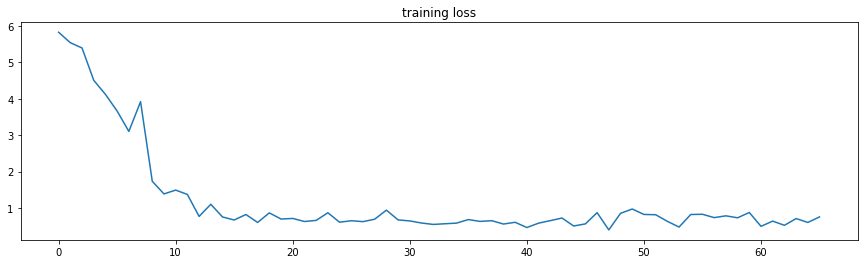

In [41]:
log_interval = 5
n_epoch = 2

pbar_update = 1 / (len(train_loader))

losses = []

# The transform needs to live on the same device as the model and the data.
transform = transform.to(device)
with tqdm(total=n_epoch) as pbar:
    for epoch in range(1, n_epoch + 1):
        train(model, epoch, log_interval)
        scheduler.step()

# Let's plot the training loss versus the number of iteration.
plt.plot(losses);
plt.title("training loss");
